# Symplectic Integrators

In [1]:
# author: Christian Offen
# accompanying source code for the handbook article 
# "Solving ODEs for Nonlinear Dynamics with Symplectic and Geometric Integration" within "Handbook on Nonlinear Dynamics. Volume 2 Numerical Methods", World Scientific, editor: Vincent Acary

In [2]:
using Plots
using LinearAlgebra
using LaTeXStrings

## Implementation of integrators

In [3]:
# generic method for fixpoint iterations to solve F(z)=z with initial value y0
function Fixpoint(F,y0; maxIter=10000, TOL=1e-16)
    y1 = F(y0); iter = 0;     
    while (norm(y1-y0)> TOL) && (iter < maxIter)
        y0 = y1
        y1 = F(y0)
        iter = iter+1
    end
    return y1
end

# Euler method for y'(t)=f(y(t)) with initial value y
# not symplectic
function Euler(y,f,h)
    return y + h*f(y)
end

# implicit Euler method for y'(t)=f(y(t)) with initial value y
# not symplectic
function IEuler(y,f,h)
    hY=Fixpoint( hY -> h*f(y+hY),0.0*y)
    return y+hY
end

# trapezoidal rule as composition of Euler and IEuler
# not symplectic but conjugate symplectic
function EulerIEuler(y,f,h)
    y=Euler(y,f,0.5*h)
    y=IEuler(y,f,0.5*h)
    return y
end

# Explicit midpoint RK2 (not symplectic)
function ExplicitMP(y,f,h)
    return y + h*f(y+h/2*f(y))
end

ExplicitMP (generic function with 1 method)

In [4]:
# Explicit Störmer-Verlet for Hamilton's equations
# symplectic
# Hq(q), Hp(q,p) gradients of Hamiltonian, Hq independent of p
# f = [Hq; Hp]
function ExplicitStoermerVerlet(y,f,h)
    n = Int(length(y)/2)
    f[1] = Hq; f[2] = Hp;
    q = y[1:n]; p=y[n+1:end]
    p = p -h*Hq(q)
    q = q + h*Hp(q,p)
    return [q;p]
end 

ExplicitStoermerVerlet (generic function with 1 method)

In [5]:
# generic function to apply 1-step function iteratively
function Integrator(method,y0,f,h,steps::Int)
    y = zeros(length(y0),steps+1)
    y[:,1] = y0
    for k=1:steps
        y[:,k+1] = method(y[:,k],f,h)
    end
    return y
end

Integrator (generic function with 1 method)

## Numerical experiment

In [6]:
# definition of dynamical system for mechanical Hamiltonian H(q,p)
# with partial gradient Hq only depending on q
# such that the ode is of the form
# q' = Hq(q)
# p' = Hp(q,p)
# where Hq denotes the gradient of H w.r.t. q
# where Hp denotes the gradient of H w.r.t. q,p

# mathematical pendulum
# Hamiltonian and its gradient
M = 1
invM = inv(M)
U(q) = -cos(q)
gradU(q) = sin.(q)
HamiltonianPendulum(y) = 1/2*invM*y[2]^2 + U(y[1])
Hq(q) = gradU(q)
Hp(q,p) = invM*p

# rhs of ode
fPendulum(y) = [invM*y[2]; -gradU(y[1])]
fPendulumForStoermerVerlet = [Hq;Hp]

y0 = [1.;0] # initial value

h = 0.4 # step size
NoSteps=100 # number of steps
tPendulum = 0:h:h*NoSteps; # temporal mesh

In [7]:
# application of explicit midpoint rule (not symplectic) and Störmer-Verlet (symplectic)
yPendulumRK2=Integrator(ExplicitMP,y0,fPendulum,h,NoSteps);
yPendulumSt = Integrator(ExplicitStoermerVerlet,y0,fPendulumForStoermerVerlet,h,NoSteps);

In [8]:
# reference solution with smaller step size using Störmer-Verlet integration
refineFactor=1000
yPendulumRef=Integrator(ExplicitStoermerVerlet,y0,fPendulumForStoermerVerlet,h/refineFactor,NoSteps*refineFactor);
tRef = 0:h/refineFactor:h*NoSteps;

In [9]:
# computation of Hamiltonian energy for checking energy conservation
energyPendulumRK2 = mapslices(HamiltonianPendulum,yPendulumRK2,dims=1)[:];
energyPendulumSt = mapslices(HamiltonianPendulum,yPendulumSt,dims=1)[:];
energyPendulumRf = mapslices(HamiltonianPendulum,yPendulumRef,dims=1)[:];

### plotting

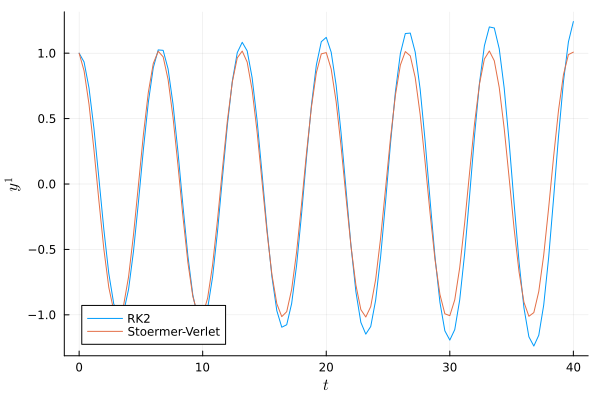

In [10]:
# time evolution
PendulumPlot = plot(tPendulum,yPendulumRK2[1,:],label="RK2",xlabel=L"t",ylabel=L"y^1")
PendulumPlot = plot!(tPendulum,yPendulumSt[1,:],label="Stoermer-Verlet",xlabel=L"t",ylabel=L"y^1")

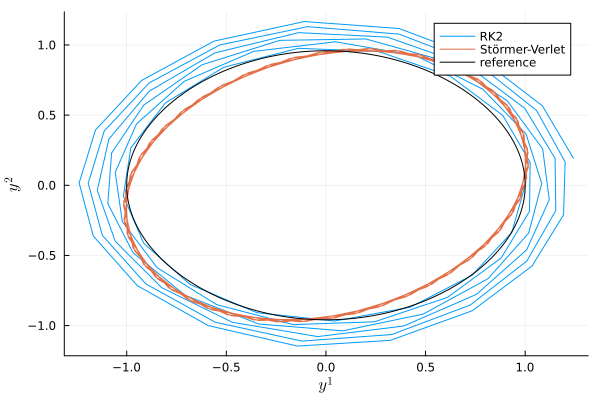

In [11]:
# dynamics in phase
PendulumPlotPhase = plot(yPendulumRK2[1,:],yPendulumRK2[2,:],label="RK2",ylabel=L"y^2",xlabel=L"y^1")
PendulumPlotPhase = plot!(yPendulumSt[1,:],yPendulumSt[2,:],label="Störmer-Verlet")
PendulumPlotPhase = plot!(yPendulumRef[1,:],yPendulumRef[2,:],label="reference", color=:black)

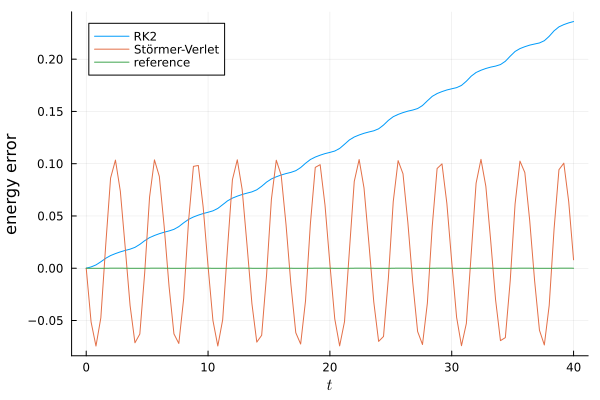

In [12]:
# energy error
PendulumEnergy = plot(tPendulum,energyPendulumRK2 .-energyPendulumRK2[1],label="RK2",xlabel=L"t",ylabel="energy error")
PendulumEnergy = plot!(tPendulum,energyPendulumSt .-energyPendulumSt[1],label="Störmer-Verlet")
PendulumEnergy = plot!(tRef,energyPendulumRf .-energyPendulumRf[1],label="reference")

### Long-term integration (symplectic integrator)

In [13]:
NoStepsLong = Int(1e8)  # number of steps
yPendulumStLong = Integrator(ExplicitStoermerVerlet,y0,fPendulumForStoermerVerlet,h,NoStepsLong); # integration with Störmer Verlet

In [14]:
tLong=0:h:h*NoStepsLong; # time mesh for plotting
subsampleFactor=8000 # do not plot every point
Tlong=tLong[1:subsampleFactor:end]; # compute subsampled mesh

yPendulumSub = yPendulumStLong[:,1:subsampleFactor:end]; # subsample values for plotting
energyPendulumStLong = mapslices(HamiltonianPendulum,yPendulumSub,dims=1)[:]; # compute energy error

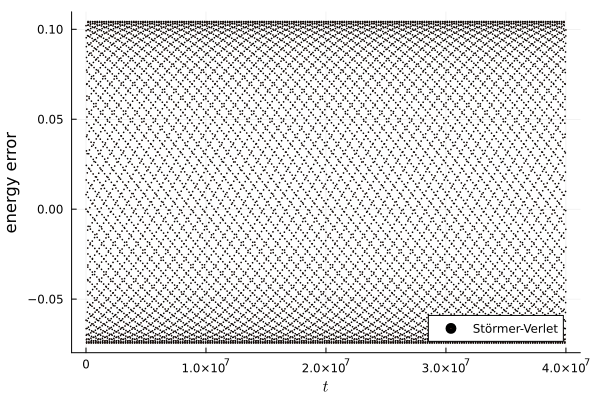

In [15]:
# plot subsampled energy error of symplectic long-term integration
PendulumEnergyLong = scatter(Tlong,energyPendulumStLong .-energyPendulumStLong[1],label="Störmer-Verlet",xlabel=L"t",ylabel="energy error", marker=:circle, markersize=0.5, color=:2, right_margin = 3Plots.mm)